Copyright 2021 The TensorFlow Similarity Authors.

In [1]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Tensorflow Similarity Supervised Learning Visualization
TensorFlow Similarity is a python library focused on making metric learning with TensorFlow easy. 

It can be used for tasks such as:

- Training and serving models that allow you to find similar items, such as images.

- Create embedding features that can be used to build supervised classifiers.


## Notebook goal

This notebook demonstrates how to use the tensorflow similarity Evaluation Callbacks and interactive visualization.

In [2]:
import random
from time import time
from matplotlib import pyplot as plt
from IPython.display import display, Markdown

In [3]:
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import TensorBoard

In [4]:
# install TF similarity if needed
try:
    import tensorflow_similarity as tfsim  # main package
except:
    !pip install tensorflow_similarity
    import tensorflow_similarity as tfsim

In [5]:
from tensorflow_similarity.architectures import EfficientNetSim  # EfficientNet based image similarity model
from tensorflow_similarity.callbacks import EvalCallback  # evaluate matching performance
from tensorflow_similarity.callbacks import SplitValidationLoss # evaluate validation loss on known and unknown classes
from tensorflow_similarity.losses import CircleLoss # specialized similarity loss
from tensorflow_similarity.samplers import TFDatasetMultiShotMemorySampler  # Get and samples TF dataset catalog
from tensorflow_similarity.visualization import projector  # allows to interactively explore the samples in 2D space
from tensorflow_similarity.visualization import viz_neigbors_imgs  # Neigboors vizualisation
from tensorflow_similarity.visualization import confusion_matrix  # matching performance
from tensorflow_similarity.utils import tf_cap_memory

In [6]:
tfsim.utils.tf_cap_memory()

# Data preparation
Loading the *Oxford-IIIT pet dataset* directly from the 
[TensorFlow dataset catalog](https://www.tensorflow.org/datasets/catalog/oxford_iiit_pet).
This dataset has 37 classes with roughly 200 images for each class.

In [7]:
IMG_SIZE = 300

# preprocessing function that resizes images to ensure all images are the same shape
def resize(img, label):
    size  = 300  # slightly larger than EfficienNetB0 size to allow random crops.
    with tf.device("/cpu:0"):
        img = tf.cast(img, dtype="int32")
        img = tf.image.resize_with_pad(img, IMG_SIZE, IMG_SIZE)
        return img, label        

## TFDatasetMultiShotMemorySampler
The following cell loads data directly from the TensorFlow catalog using TensorFlow similarity
`TFDatasetMultiShotMemorySampler`. 

Using a sampler is required to ensure that 
each batch contains at least N samples of each classes (usually 2). Otherwise 
contrastive loss cannot work properly.

As a Similarity Models allows us to match data from unseen classes, you can
experiment with the model's ability to generalize by only trainig on a subset of 
the classes. 

As expected, the model performance will improve as we include more 
classes in the training data.

In [8]:
training_classes = 30
train_cls = range(training_classes)
classes_per_batch = min(16, training_classes)

# use the train split for training
train_ds = TFDatasetMultiShotMemorySampler('oxford_iiit_pet', 
                                           splits='train', 
                                           classes_per_batch=classes_per_batch,
                                           preprocess_fn=resize, 
                                           class_list=train_cls  # We filter train data to only keep the train classes.
                                          )

# use the test split for indexing and querying
test_ds = TFDatasetMultiShotMemorySampler('oxford_iiit_pet', 
                                          splits='test', 
                                          classes_per_batch=classes_per_batch,
                                          preprocess_fn=resize)

converting train:   0%|          | 0/3680 [00:00<?, ?it/s]

Preprocessing data:   0%|          | 0/3680 [00:00<?, ?it/s]


Batch size is 32 (16 class X 2 example per class pre-augmentation


filtering examples:   0%|          | 0/3680 [00:00<?, ?it/s]

selecting classes:   0%|          | 0/30 [00:00<?, ?it/s]

indexing classes:   0%|          | 0/2981 [00:00<?, ?it/s]

converting test:   0%|          | 0/3669 [00:00<?, ?it/s]

Preprocessing data:   0%|          | 0/3669 [00:00<?, ?it/s]


Batch size is 32 (16 class X 2 example per class pre-augmentation


filtering examples:   0%|          | 0/3669 [00:00<?, ?it/s]

selecting classes:   0%|          | 0/37 [00:00<?, ?it/s]

indexing classes:   0%|          | 0/3669 [00:00<?, ?it/s]

## class mapping
Dictionary that maps the class id to its name. Will be used in the vizualization.

In [9]:
breeds = {0: 'Abyssinian', 1: 'American bulldog', 2: 'American pit bull terrier', 3: 'Basset hound', 4: 'Beagle', 5: 'Bengal', 6: 'Birman', 7: 'Bombay', 8: 'Boxer', 9: 'British shorthair', 10: 'Chihuahua', 11: 'Egyptian mau', 12: 'English cocker spaniel', 13: 'English setter', 14: 'German shorthaired', 15: 'Great pyrenees', 16: 'Havanese', 17: 'Japanese chin', 18: 'Keeshond', 19: 'Leonberger', 20: 'Maine coon', 21: 'Miniature pinscher', 22: 'Newfoundland', 23: 'Persian', 24: 'Pomeranian', 25: 'Pug', 26: 'Ragdoll', 27: 'Russian blue', 28: 'Saint bernard', 29: 'Samoyed', 30: 'Scottish terrier', 31: 'Shiba inu', 32: 'Siamese', 33: 'Sphynx', 34: 'Staffordshire bull terrier', 35: 'Wheaten terrier', 36: 'Yorkshire terrier'}
species = {0: 'Dog', 1: 'Cat', 2: 'Cat', 3: 'Cat', 4: 'Cat', 5: 'Dog', 6: 'Dog', 7: 'Dog', 8: 'Cat', 9: 'Dog', 10: 'Cat', 11: 'Dog', 12: 'Cat', 13: 'Cat', 14: 'Cat', 15: 'Cat', 16: 'Cat', 17: 'Cat', 18: 'Cat', 19: 'Cat', 20: 'Dog', 21: 'Cat', 22: 'Cat', 23: 'Dog', 24: 'Cat', 25: 'Cat', 26: 'Dog', 27: 'Dog', 28: 'Cat', 29: 'Cat', 30: 'Cat', 31: 'Cat', 32: 'Dog', 33: 'Dog', 34: 'Cat', 35: 'Cat', 36: 'Cat'}

# Model


## Evaluation callback
TensorFlow Similarity provides callbacks that makes it easy to evaluate the performance during training. This callback works by taking as input as set of `targets`/`target_labels` which are examples you want to match against and a set of `queries` / `query_labels` that what you want to matches.

Here we are going to use part of the test dataset as targets and another part as queries. 

Notes:

- callback only runs at epoch_end to avoid slowing down the training.
- writing to TF metrics is currently broken pending changes in TensorFlow.
- Logging to TensorBoard works - just add a `tf_logdir` path as illustrated below.

In [10]:
num_targets = 200 #@param {type:"int"}
num_queries = 300 #@param {type:"int"}
k = 3 #@param {type:"int"}
log_dir = 'logs/%d/' % (time())

# TFsim callback for match rate
queries_x, queries_y = test_ds.get_slice(0, num_queries)
targets_x, targets_y = test_ds.get_slice(num_queries, num_targets)
tsc = EvalCallback(
    queries_x,
    queries_y,
    targets_x,
    targets_y, 
    k=k, 
    tb_logdir=log_dir
)
  
# Tensorboard callback
tbc = TensorBoard(log_dir=log_dir)

val_x, val_y = test_ds.get_slice(0, 1000)
# SplitValidation callback
val_loss = SplitValidationLoss(
    x=val_x, 
    y=val_y, 
    known_classes=tf.constant(train_cls),
)

TensorBoard logging enable in logs/1629394827/index


## Model training

Training the model for at least 10 epochs is important to get meaningful results.

To improve performance, you can experiment with:
* increasing the `embedding_size`
* changing the loss function
* tweaking the learning rate

Additionally, you can also experiment with replacing the `EfficientNetSim` model which is a 
wrapper around the EfficientNet architecture model with basic data augmentation. 

In [11]:
embedding_size = 256 #@param {type:"integer"}
epochs = 10 #@param {type:"integer"}
val_steps = 10 

# building model
model = EfficientNetSim(train_ds.example_shape, embedding_size)

# init specialized loss
gamma = 256  # Loss hyper-parameter. 256 works well here.
loss = CircleLoss(gamma=gamma)

# compiling and training
LR = 0.00005
model.compile(optimizer=Adam(LR), loss=loss)
history = model.fit(train_ds,
                    epochs=epochs,
                    validation_data=test_ds,
                    validation_steps=val_steps,
                    callbacks=[val_loss, tbc, tsc])

Distance metric automatically set to cosine use the distance arg to override.
Epoch 1/10
   5/1000 [..............................] - ETA: 3:39 - loss: 48.9756WARNING:tensorflow:Callback method `on_train_batch_begin` is slow compared to the batch time (batch time: 0.0323s vs `on_train_batch_begin` time: 0.0587s). Check your callbacks.


1000/1000 [==============================] - 41s 34ms/step - loss: 39.7067 - val_loss: 34.2162
val_los - known_classes: 24.5642 - unknown_classes: 54.6297
accuracy:0.0300 - mean_rank:4.0903
Warmup complete
Epoch 2/10
1000/1000 [==============================] - 31s 31ms/step - loss: 26.1930 - val_loss: 35.1568
val_los - known_classes: 22.7384 - unknown_classes: 56.5315
accuracy:0.0267 - mean_rank:4.1099
Epoch 3/10
1000/1000 [==============================] - 32s 32ms/step - loss: 21.3383 - val_loss: 33.1189
val_los - known_classes: 22.1902 - unknown_classes: 57.1371
accuracy:0.0267 - mean_rank:4.0569
Epoch 4/10
1000/1000 [==============================] - 32s 32ms/step - loss: 18.2532 - val_loss: 26.7985
val_los - known_classes: 21.7953 - unknown_classes: 60.2626
accuracy:0.0233 - mean_rank:4.0707
Epoch 5/10
1000/1000 [==============================] - 32s 32ms/step - loss: 15.7992 - val_loss: 28.5653
val_los - known_classes: 21.6261 - unknown_classes: 60.9073
accuracy:0.0300 - mean_ra

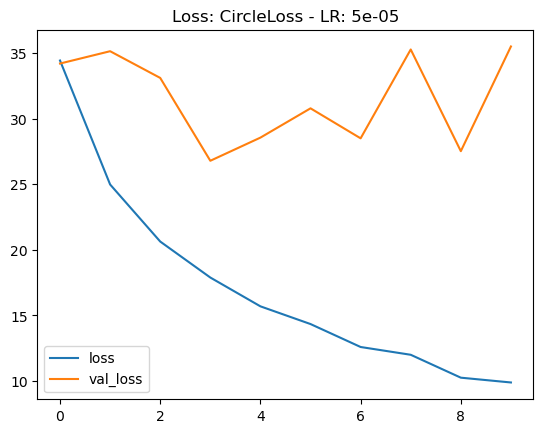

In [12]:
# expect loss: 0.05 / val_loss: 0.8
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['loss', 'val_loss'])
plt.title(f'Loss: {loss.name} - LR: {LR}')
plt.show()

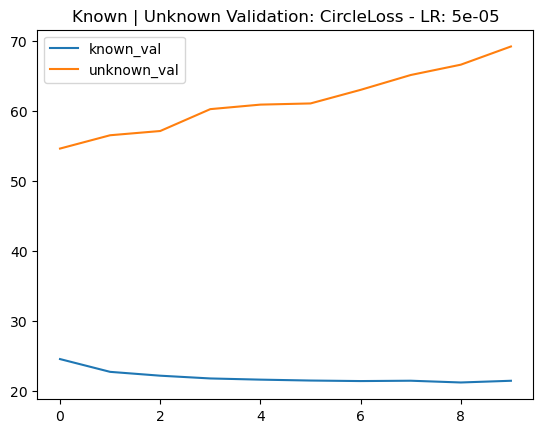

In [13]:
# expect loss: 0.05 / val_loss: 0.8
plt.plot(history.history['known_val_loss'])
plt.plot(history.history['unknown_val_loss'])
plt.legend(['known_val', 'unknown_val'])
plt.title(f'Known | Unknown Validation: {loss.name} - LR: {LR}')
plt.show()

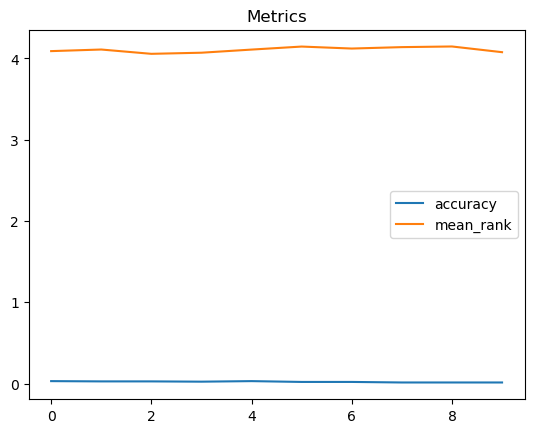

In [14]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['mean_rank'])
plt.legend(['accuracy', 'mean_rank'])
plt.title('Metrics')
plt.show()

# Indexing
We are going to index about 1000 examples from all 37 classes
and use the remainder of the test dataset as unseen queries

In [15]:
# What is indexed
index_size = 1000
query_size = 1000
index_x, index_y = test_ds.get_slice(0, index_size)
index_data = tf.cast(index_x, dtype='int32')  # casted so it can displayed

# what will be used as never seen before queries to test performance
test_x, test_y = test_ds.get_slice(index_size, query_size)
test_y = [int(c) for c in test_y]
test_data = tf.cast(test_x, dtype='int32')  # casted so it can displayed

In [16]:
model.reset_index()
model.index(index_x, index_y, data=index_data)

[Indexing 1000 points]
|-Computing embeddings
|-Storing data points in index table
|-Adding embeddings to index.
|-Building index.


## Visualize model retrival

We are using the model `lookup()` api to query for the nearest neighboors of our
unseen query dataset and then use the `viz_neigbors_imgs` to visualize them and 
checking that the matched images are vizually similar.


Performing NN search



Building NN list:   0%|          | 0/5 [00:00<?, ?it/s]

**Known Class**

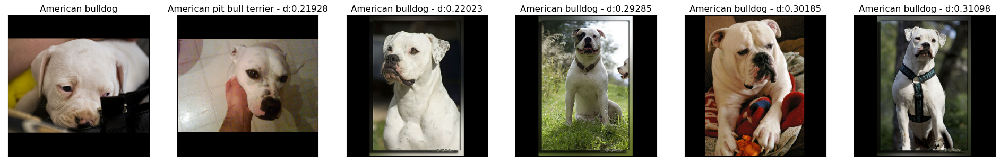

**Known Class**

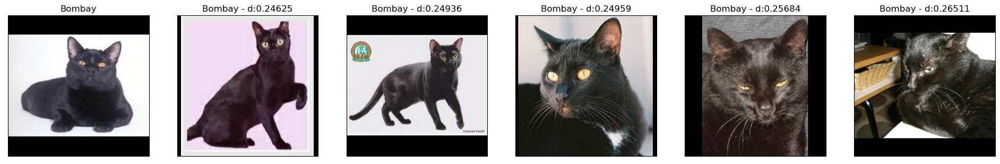

**Unknown Class**

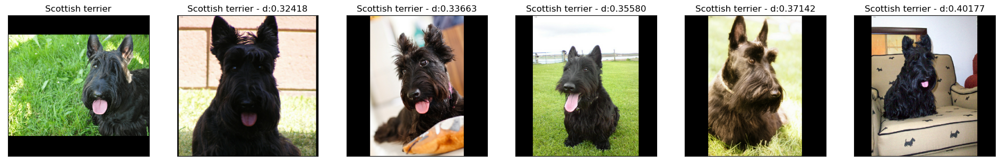

**Known Class**

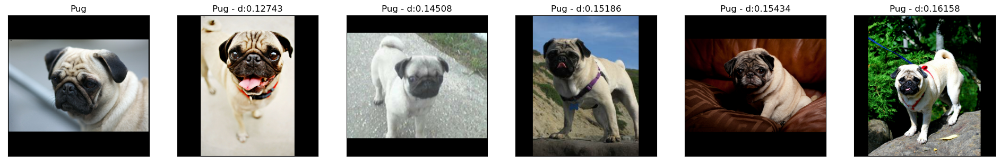

**Known Class**

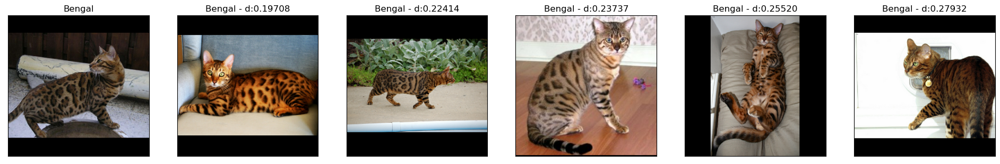

In [25]:
num_examples = 5
num_neigboors = 5
idxs = random.sample(range(len(test_y)), num_examples)
batch = tf.gather(test_x, idxs)
nns = model.lookup(batch, k=num_neigboors)
for bid, nn in zip(idxs, nns):
    # view results close by
    if test_y[bid] in train_cls:
        display(Markdown('**Known Class**'))
    else:
        display(Markdown('**Unknown Class**'))
    viz_neigbors_imgs(test_data[bid], test_y[bid], nn, class_mapping=breeds, cmap='Greys')

## Visualize clusters

Let's project the embedding into a 2D space to see how well the model grouped similar images together.

In [18]:
index_size = 2000
image_size = 96
plot_size = 800
vx, vy = test_ds.get_slice(0, index_size)
projector(model.predict(vx), labels=vy, images=vx, class_mapping=breeds, 
          image_size=image_size, plot_size=plot_size)

perfoming projection using UMAP


generating diplayabe images:   0%|          | 0/2000 [00:00<?, ?it/s]

Loading BokehJS ...